## Домашняя работа #4.

Домашнее задание сдаётся в виде ссылки (с доступом комментатор или редактор) на Colab в опросе.

Отправлять ссылку через форму нужно только один раз. Исправления вносятся в тот же ноутбук до хард-дедлайна и помечаются комментариями в коде и комментариями к соотвествующим ячейкам.


Домашка на использование параметрических моделей.
* Ransac.
* Hough transform.


**Soft deadline: 25.04.2023 03:00:00 +0003 GMT**

**Hard deadline: 02.05.2023 03:00:00 +0003 GMT**

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import imageio
import imutils
cv2.ocl.setUseOpenCL(False)

# RANSAC

Ниже приведены блоки кода с помощью которых можно склеивать панорамы в единую картинку.
* Извлекаем ключевые точки
* Сопоставляем похожие
* Ищем гомографию
* Склеиваем изображения

Гомография это обычное преобразование одник координат к другим с помощью матрицы. Мы должны с помощью `RANSAC` найти параметры этой матрицы.
Для этого вы случайно берете `s` точек, по ним оцениваете значения $h_{11}$, .., $h_{33}$ считаете значние ошибки сопоставления на всех точках, etc

# Скачиваем картинки

In [ ]:
# select the image id (valid values 1,2,3, or 4)
feature_extractor = 'orb' # one of 'sift', 'surf', 'brisk', 'orb'
feature_matching = 'bf'

<ipython-input-4-b05913bc9093>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  trainImg = imageio.imread('http://www.ic.unicamp.br/~helio/imagens_registro/foto1A.jpg')
<ipython-input-4-b05913bc9093>:4: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  queryImg = imageio.imread('http://www.ic.unicamp.br/~helio/imagens_registro/foto1B.jpg')


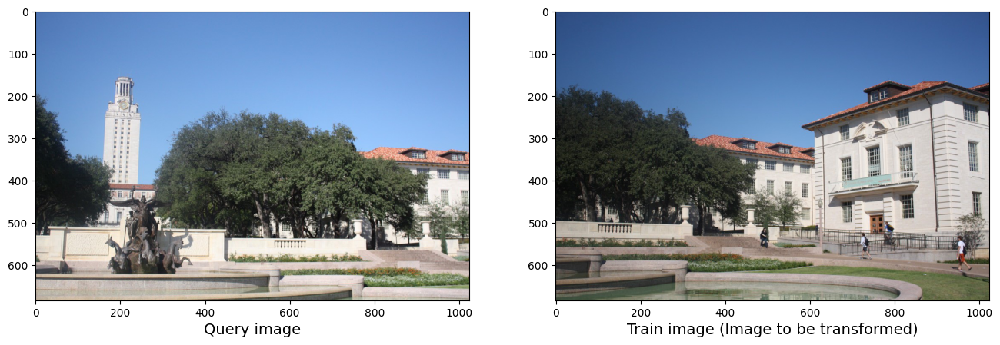

In [ ]:
trainImg = imageio.imread('http://www.ic.unicamp.br/~helio/imagens_registro/foto1A.jpg')
trainImg_gray = cv2.cvtColor(trainImg, cv2.COLOR_RGB2GRAY)

queryImg = imageio.imread('http://www.ic.unicamp.br/~helio/imagens_registro/foto1B.jpg')
# Opencv defines the color channel in the order BGR.
# Transform it to RGB to be compatible to matplotlib
queryImg_gray = cv2.cvtColor(queryImg, cv2.COLOR_RGB2GRAY)

fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, constrained_layout=False, figsize=(16,9))
ax1.imshow(queryImg, cmap="gray")
ax1.set_xlabel("Query image", fontsize=14)

ax2.imshow(trainImg, cmap="gray")
ax2.set_xlabel("Train image (Image to be transformed)", fontsize=14)

plt.show()

# Ищем ключевые точки и вычисляем дексрипторы

In [ ]:
def detectAndDescribe(image, method=None):
    """
    Compute key points and feature descriptors using an specific method
    """

    assert method is not None, "You need to define a feature detection method. Values are: 'sift', 'surf'"

    # detect and extract features from the image
    if method == 'sift':
        descriptor = cv2.xfeatures2d.SIFT_create()
    elif method == 'surf':
        descriptor = cv2.xfeatures2d.SURF_create()
    elif method == 'brisk':
        descriptor = cv2.BRISK_create()
    elif method == 'orb':
        descriptor = cv2.ORB_create()

    # get keypoints and descriptors
    (kps, features) = descriptor.detectAndCompute(image, None)

    return (kps, features)

In [ ]:
kpsA, featuresA = detectAndDescribe(trainImg_gray, method=feature_extractor)
kpsB, featuresB = detectAndDescribe(queryImg_gray, method=feature_extractor)

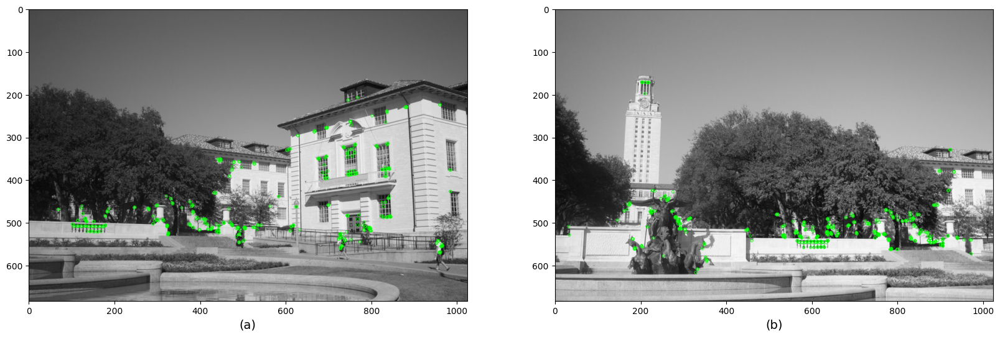

In [ ]:
# display the keypoints and features detected on both images
fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20,8), constrained_layout=False)
ax1.imshow(cv2.drawKeypoints(trainImg_gray,kpsA,None,color=(0,255,0)))
ax1.set_xlabel("(a)", fontsize=14)
ax2.imshow(cv2.drawKeypoints(queryImg_gray,kpsB,None,color=(0,255,0)))
ax2.set_xlabel("(b)", fontsize=14)

plt.show()

# Ищем похожие дескрипторы

In [ ]:
def createMatcher(method,crossCheck):
    "Create and return a Matcher Object"

    if method == 'sift' or method == 'surf':
        bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=crossCheck)
    elif method == 'orb' or method == 'brisk':
        bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=crossCheck)
    return bf

In [ ]:
def matchKeyPointsBF(featuresA, featuresB, method):
    bf = createMatcher(method, crossCheck=True)

    # Match descriptors.
    best_matches = bf.match(featuresA,featuresB)

    # Sort the features in order of distance.
    # The points with small distance (more similarity) are ordered first in the vector
    rawMatches = sorted(best_matches, key = lambda x:x.distance)
    print("Raw matches (Brute force):", len(rawMatches))
    return rawMatches

In [ ]:
def matchKeyPointsKNN(featuresA, featuresB, ratio, method):
    bf = createMatcher(method, crossCheck=False)
    # compute the raw matches and initialize the list of actual matches
    rawMatches = bf.knnMatch(featuresA, featuresB, 2)
    print("Raw matches (knn):", len(rawMatches))
    matches = []

    # loop over the raw matches
    for m,n in rawMatches:
        # ensure the distance is within a certain ratio of each
        # other (i.e. Lowe's ratio test)
        if m.distance < n.distance * ratio:
            matches.append(m)
    return matches

Using: bf feature matcher
Raw matches (Brute force): 191


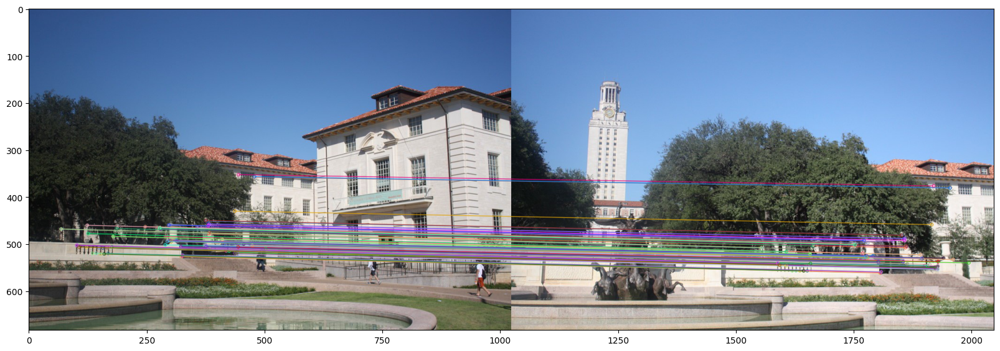

In [ ]:
print("Using: {} feature matcher".format(feature_matching))

fig = plt.figure(figsize=(20,8))

if feature_matching == 'bf':
    matches = matchKeyPointsBF(featuresA, featuresB, method=feature_extractor)
    img3 = cv2.drawMatches(trainImg,kpsA,queryImg,kpsB,matches[:100],
                           None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
elif feature_matching == 'knn':
    matches = matchKeyPointsKNN(featuresA, featuresB, ratio=0.75, method=feature_extractor)
    img3 = cv2.drawMatches(trainImg,kpsA,queryImg,kpsB,np.random.choice(matches,100),
                           None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)


plt.imshow(img3)
plt.show()

# Сопоставление ключевых точек на изображении

In [ ]:
def getHomography(kpsA, kpsB, featuresA, featuresB, matches, reprojThresh):
    # convert the keypoints to numpy arrays
    kpsA = np.float32([kp.pt for kp in kpsA])
    kpsB = np.float32([kp.pt for kp in kpsB])

    if len(matches) > 4:

        # construct the two sets of points
        ptsA = np.float32([kpsA[m.queryIdx] for m in matches])
        ptsB = np.float32([kpsB[m.trainIdx] for m in matches])

        # estimate the homography between the sets of points
        (H, status) = cv2.findHomography(ptsA, ptsB, cv2.RANSAC,
            reprojThresh)

        return (matches, H, status)
    else:
        return None

In [ ]:
M = getHomography(kpsA, kpsB, featuresA, featuresB, matches, reprojThresh=4)
if M is None:
    print("Error!")
(matches, H, status) = M
print(H)

[[ 8.26213532e-01  1.13337816e-01  4.25943721e+02]
 [-1.24949994e-01  9.98737151e-01  5.46483135e+01]
 [-1.93036512e-04  5.05754027e-05  1.00000000e+00]]


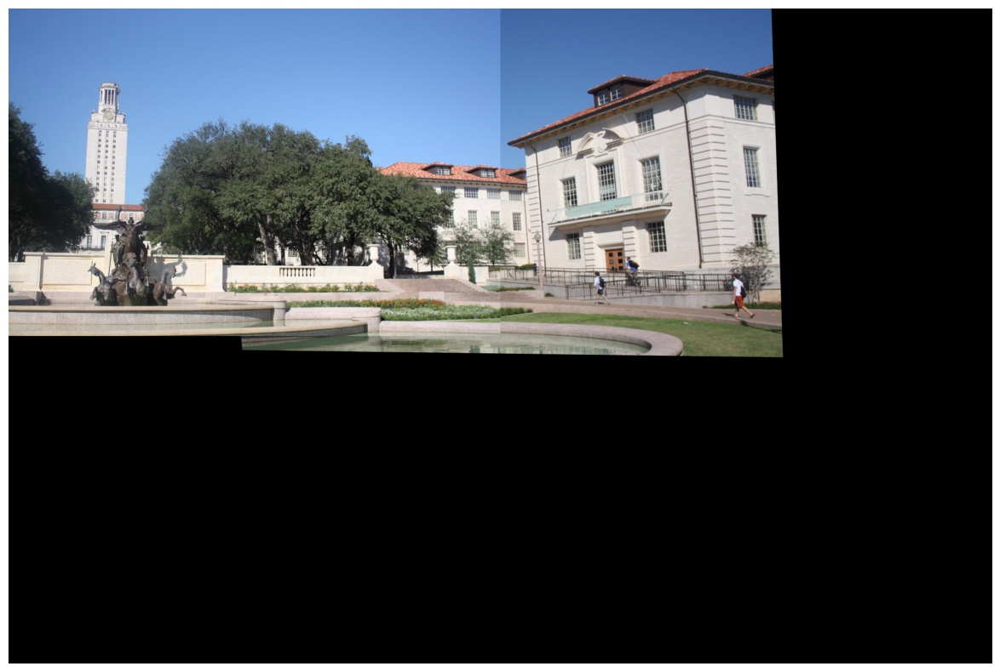

In [ ]:
# Apply panorama correction
width = trainImg.shape[1] + queryImg.shape[1]
height = trainImg.shape[0] + queryImg.shape[0]

result = cv2.warpPerspective(trainImg, H, (width, height))
result[0:queryImg.shape[0], 0:queryImg.shape[1]] = queryImg

plt.figure(figsize=(20,10))
plt.imshow(result)

plt.axis('off')
plt.show()

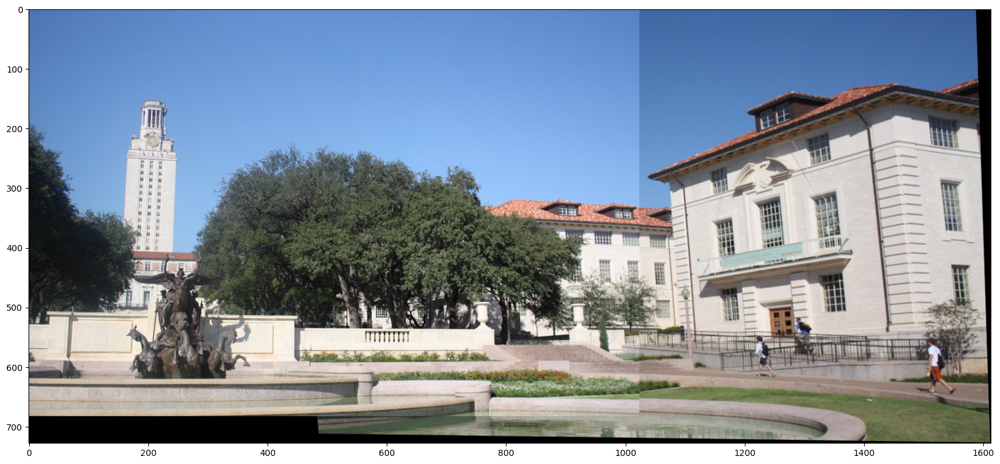

In [ ]:
# transform the panorama image to grayscale and threshold it
gray = cv2.cvtColor(result, cv2.COLOR_BGR2GRAY)
thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY)[1]

# Finds contours from the binary image
cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = imutils.grab_contours(cnts)

# get the maximum contour area
c = max(cnts, key=cv2.contourArea)

# get a bbox from the contour area
(x, y, w, h) = cv2.boundingRect(c)

# crop the image to the bbox coordinates
result = result[y:y + h, x:x + w]

# show the cropped image
plt.figure(figsize=(20,10))
plt.imshow(result)

**Задание 1. (20 баллов)**

Напишите свою функцию `findHomography` , которая принмает на вход список сопоставленных точек и использует `RANSAC` для определния матрицы гомографии. Примените вашу функцию и сравните результат. Склейте панораму используя матрицу гомографии. `RANSAC` тоже нужно имплементировать самостоятельно.

In [ ]:
import random

In [ ]:
def findHomography(kpsA, kpsB, matches):
  kpsA = np.float32([kp.pt for kp in kpsA])
  kpsB = np.float32([kp.pt for kp in kpsB])

  if len(matches) > 4:
    ptsA = np.float32([kpsA[m.queryIdx] for m in matches])
    ptsB = np.float32([kpsB[m.trainIdx] for m in matches])

    homography = ransac(ptsA, ptsB)
    return homography

  else:
    return None


# ransac with adaptive number of iterations
def ransac(ptsA, ptsB, threshold=1.0, max_iterations=1000, probability=0.95, s = 4):
  best_H = None
  best_inlier_count = 0

  n_iters = np.inf
  sample_count = 0

  num_points = ptsA.shape[0]
  indices = np.arange(num_points)

  while n_iters > sample_count:
    # build a new sample, build a hypothesis on this sample, test the hypothesis on all data
    # Calculate the share of outliers for the constructed hypothesis: e = 1 – (number of inliers)/(total number of points)
    # Update the value of N relative to the new value of e:
    np.random.shuffle(indices)
    subset_indices = indices[:s]
    subsetA = ptsA[subset_indices]
    subsetB = ptsB[subset_indices]

    H = cv2.getPerspectiveTransform(subsetA, subsetB)
    transformed_pts = cv2.perspectiveTransform(ptsA.reshape(-1, 1, 2), H).reshape(-1, 2)

    residuals = np.linalg.norm(transformed_pts - ptsB, axis=1)
    inliers = residuals < threshold

    if inliers.sum() > best_inlier_count:
      best_H = H
      best_inlier_count = inliers.sum()

      e = 1 - (best_inlier_count / num_points)
      n_iters = np.log(1 - probability) / np.log(1 - (1 - e)**s)

    sample_count += 1

  print(n_iters)
  return best_H

In [ ]:
HH = findHomography(kpsA, kpsB,matches)

1062.2175998877156


In [ ]:
HH

array([[ 8.41441965e-01,  1.31662438e-01,  4.13578482e+02],
       [-1.20468858e-01,  9.89521454e-01,  5.83734678e+01],
       [-1.74856542e-04,  4.42261618e-05,  1.00000000e+00]])

In [ ]:
np.abs(HH-H)

array([[1.52284337e-02, 1.83246216e-02, 1.23652392e+01],
       [4.48113525e-03, 9.21569684e-03, 3.72515426e+00],
       [1.81799706e-05, 6.34924084e-06, 0.00000000e+00]])

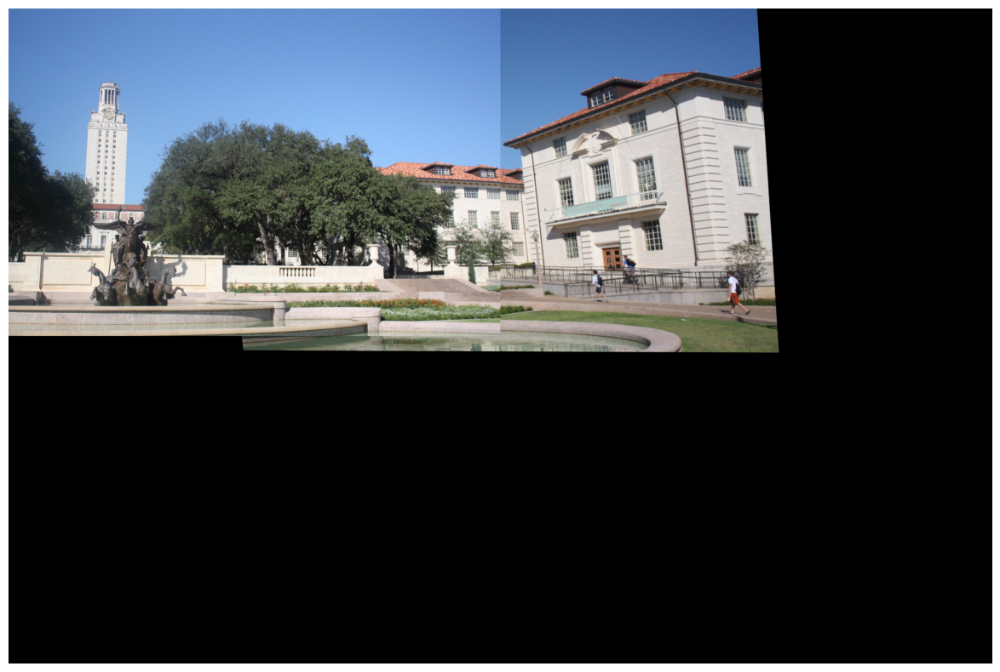

In [ ]:
# Apply panorama correction
result_ = cv2.warpPerspective(trainImg, HH, (width, height))
result_[0:queryImg.shape[0], 0:queryImg.shape[1]] = queryImg

plt.figure(figsize=(20,10))
plt.imshow(result_)

plt.axis('off')
plt.show()

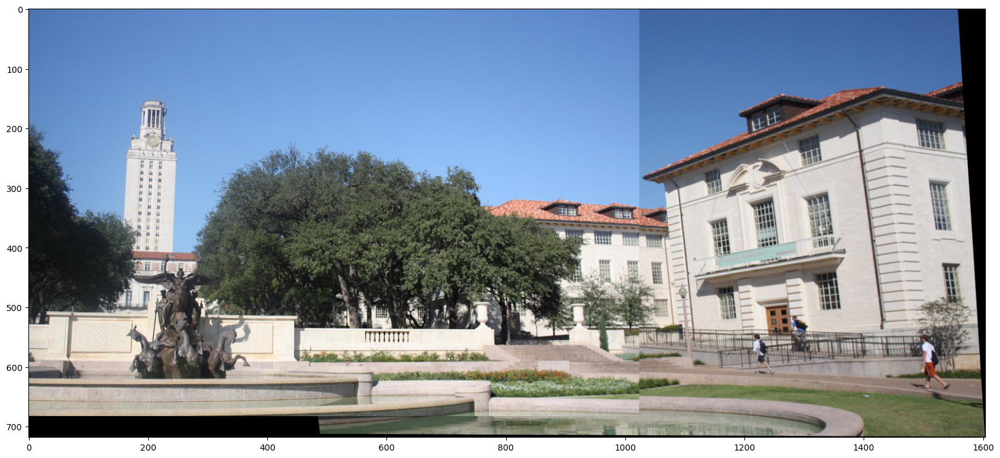

In [ ]:
# transform the panorama image to grayscale and threshold it
gray_ = cv2.cvtColor(result_, cv2.COLOR_BGR2GRAY)
thresh_ = cv2.threshold(gray_, 0, 255, cv2.THRESH_BINARY)[1]

# Finds contours from the binary image
cnts_ = cv2.findContours(thresh_.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts_ = imutils.grab_contours(cnts_)

# get the maximum contour area
c_ = max(cnts_, key=cv2.contourArea)

# get a bbox from the contour area
(x_, y_, w_, h_) = cv2.boundingRect(c_)

# crop the image to the bbox coordinates
result_ = result_[y_:y_ + h_, x_:x_ + w_]

# show the cropped image
plt.figure(figsize=(20,10))
plt.imshow(result_)

**Задание 2. (10 баллов)**

Напишите преобразование Хафа для поиска окружностей. Если для прямых мы делали трюк с превращением одного из параметров в cos для того, чтобы он был ограничен, то тут, кажется, нам надо перебрать координаты и всевозможные радиусы.  Примените его для поиска окружнойтей на изображении *сoins_noize_1.jpg* из предыдущего домашнего задания. Если не хотите перебирать руками все радиусы, то можно попробовать вдохновиться [этой работой](https://www.ecse.rpi.edu/~cvrl/Publication/pdf/Xie2002.pdf)

Сравните вашу функцию с функцией `cv.HoughCircles` по времени работы и по качеству.

In [ ]:
coins = imageio.imread('https://i.ibb.co/ph1PsxL/coins-1.jpg')
coins_gray = cv2.cvtColor(coins, cv2.COLOR_RGB2GRAY)

<ipython-input-72-44ba339a0e12>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  coins = imageio.imread('https://i.ibb.co/ph1PsxL/coins-1.jpg')


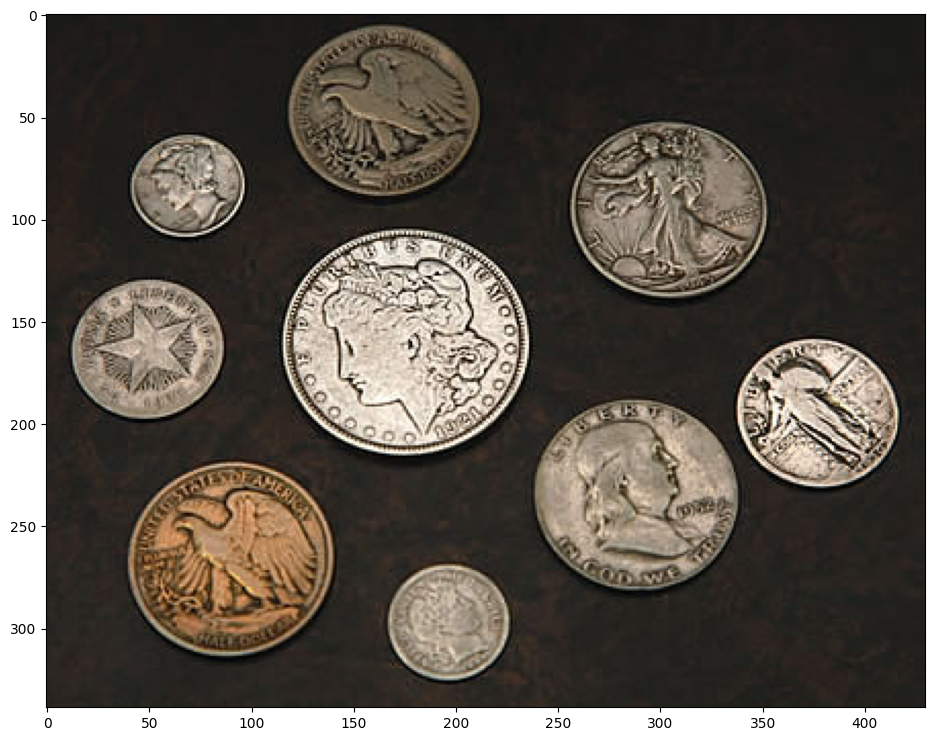

In [ ]:
fig, ax = plt.subplots(nrows=1, ncols=1, constrained_layout=False, figsize=(16,9))
ax.imshow(coins, cmap="gray")

plt.show()

In [ ]:
from google.colab.patches import cv2_imshow

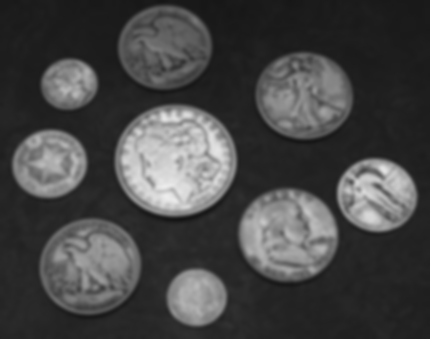

In [ ]:
blurred_image = cv2.GaussianBlur(coins_gray, (9, 9), 2)
cv2_imshow(blurred_image)

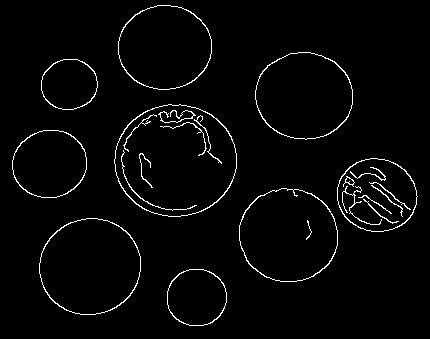

In [ ]:
edges = cv2.Canny(blurred_image, 60, 200)
cv2_imshow(edges)

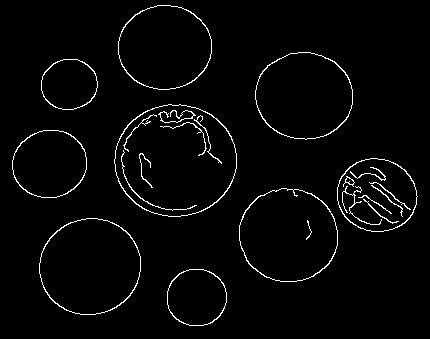

In [ ]:
_, bin_coins = cv2.threshold(edges, 0, 255, cv2.THRESH_BINARY)
cv2_imshow(bin_coins)

In [ ]:
def hough_circles(img, param1=20, param2=30, minRadius=0, angle_step=10):
  h,w = img.shape[:2]
  max_radius = int(np.max(img.shape) / 2)

  accumulator = np.zeros((h, w, max_radius), dtype=np.uint8)

  sin_table = np.sin(np.linspace(0, 2*np.pi, 360))
  cos_table = np.cos(np.linspace(0, 2*np.pi, 360))

  for y in range(h):
    for x in range(w):
      if edges[y, x] == 0:
        continue

      for r in range(minRadius, max_radius):
        for t in range(0, 360, angle_step):
          a = int(x - r*cos_table[t])
          b = int(y - r*sin_table[t])

          if a < 0 or a >= w or b < 0 or b >= h:
            continue

          accumulator[b, a, r] += 1



  circles = []

  for y in range(h):
    for x in range(w):
      already_detected = False
      for r in range(minRadius, max_radius):
        if accumulator[y, x, r] < param1:
          continue

        if accumulator[y, x, r] > param2:
          # Check that this circle has not been detected already
          for (yc, xc, rc) in circles:
            # if np.sqrt((x - xc)**2 + (y - yc)**2) < (rc + rad_table[r]):
            if np.sqrt((x - xc)**2 + (y - yc)**2) < rc:
              already_detected = True
              break
          if already_detected:
            continue


          # Add the candidate as a new circle
          circles.append((x, y, r))

          # Remove all other candidates that overlap with this circle
          for i, (yc, xc, rc) in enumerate(circles[:-1]):
            if np.sqrt((x - xc)**2 + (y - yc)**2) < rc:
              circles.pop(i)

  return circles


In [ ]:
circles = hough_circles(bin_coins)

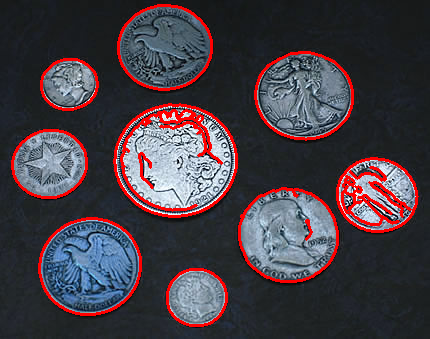

In [ ]:
output = coins.copy()
for x, y, r in circles:
    cv2.circle(output, (x, y), r, (0, 0, 255), 2)
cv2_imshow(output)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [ ]:
# for i in tqdm(range(10, 255, 10)):
#   for j in range(i, 255, 10):
#     circles = hough_circles(bin_coins, param1=i, param2=j)
#     output = coins.copy()
#     for x, y, r in circles:
#       cv2.circle(output, (x, y), r, (0, 0, 255), 2)
#     cv2_imshow(output)
#     cv2.waitKey(0)
#     cv2.destroyAllWindows()

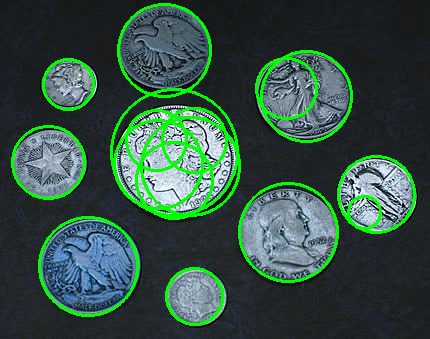

In [ ]:
circles_ = cv2.HoughCircles(bin_coins, cv2.HOUGH_GRADIENT, 1, 20, param1=20, param2=30, minRadius=0, maxRadius=0)
circles_ = np.round(circles_[0, :]).astype("int")
output = coins.copy()
for (x, y, r) in circles_:
    cv2.circle(output, (x, y), r, (0, 255, 0), 2)

cv2_imshow(output)
cv2.waitKey(0)
cv2.destroyAllWindows()